<a href="https://colab.research.google.com/github/AndreaRamirez1/Fiesta-Coctel-Familiar/blob/main/Lab2_Procesa_Int1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#INTENTO 1 "Fiesta de Cóctel Familiar"
Primeramente debemos instalar las bibliotecas correspondoentes. Acá explico de forma mas desglosada que ejecuta cada una de ellas.

In [1]:
!pip install numpy scipy matplotlib
!pip install sounddevice
!sudo apt-get install libportaudio2
!pip install ipywidgets
!pip install soundfile
!pip install scikit-learn

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  libportaudio2
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 65.3 kB of archives.
After this operation, 223 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libportaudio2 amd64 19.6.0-1.1 [65.3 kB]
Fetched 65.3 kB in 1s (125 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package libportaudio2:amd64.
(Reading database ... 123597 fil

1. !pip install numpy scipy matplotlib
  - **numpy:** Realiza operaciones matemáticas y científicas, generando un soporte para arreglos, matrices multidimensionales y funciones matemáticas.
  - **scipy:** Optimiza, integra, interpola, hace uso de álgebra lineal, procesamiento de señales y estadísticas.
  - **matplotlib:** Permite visualizar gráficos estáticos, animados e interactivos.

2. !pip install sounddevice
  - **sounddevice:** Permite la grabación y reproducción de audio en tiempo real.

3. !sudo apt-get install libportaudio2
  - **libportaudio2:** Biblioteca de código abierto para el manejo de audio en múltiples plataformas. Instalación necesaria para que **sounddevice** funcione, ya que depende de **PortAudio** para acceder al hardware de audio, manejo de grabación y reproducción.

4. !pip install ipywidgets
  - **ipywidgets:** Permite crear widgets interactivos en entornos de Jupyter Notebook o JupyterLab, puedes agregar controles de usuario que permiten la interacción dinámica con los datos y gráficos en tiempo real.

5. !pip install soundfile
  - **soundfile:** Leé y escribé archivos de audio. Compatible con varios formatos de archivos de sonido, como WAV y FLAC.

Tras instalar las bibliotecas se prpocede a cargar las librerias

In [2]:
#Cambio de Bibliotecas a variables
import numpy as np
import librosa
import ipywidgets as widgets
import soundfile as sf
import sounddevice as sd
import matplotlib.pyplot as plt

from sklearn.decomposition import FastICA
from scipy.io import wavfile
from scipy.fft import fft, ifft, fftfreq
from IPython.display import Audio

Cargamos las señales de audio a trabajar.

> **NOTA:** Si se emplea ***Colab*** se debe cargar las señales de udio en el ***Sample_data*** para su correcta ejecución. Si no, se generara un error al intentar correr el codigo.



In [3]:
# Carga de audios
sig1, S1 = librosa.load('Microph1.wav', sr=None)
sig2, S2 = librosa.load('Microph2.wav', sr=None)
sig3, S3 = librosa.load('Microph3.wav', sr=None)

# Carga de ruido
sig0, R0 = librosa.load('Ruido.wav', sr=None)

# Verificar tasas de muestreo entre señal de Audio y Ruido
if S1 != R0:
    raise ValueError("La señal 1 y el ruido tienen diferente tasa de muestreo.")
else:
    print(f"Muestreo 1: {S1} Hz")
if S2 != R0:
    raise ValueError("La señal 2 y el ruido tienen diferente tasa de muestreo.")
else:
    print(f"Muestreo 2: {S2} Hz")
if S3 != R0:
    raise ValueError("La señal 3 y el ruido tienen diferente tasa de muestreo.")
else:
    print(f"Muestreo 3: {S3} Hz")

print("") #Generamos un espacio

# Verificar que las señales tengas las mismas longitud
L1 = min(len(sig1), len(sig0))
sig1 = sig1[:L1]
sig0 = sig0[:L1]

L2 = min(len(sig2), len(sig0))
sig2 = sig2[:L2]
sig0_2 = sig0[:L2]

L3 = min(len(sig3), len(sig0))
sig3 = sig3[:L3]
sig0_3 = sig0[:L3]

# Imprimir si la longitud es la misma y mostrar el tamaño
if len(sig1) == len(sig0):
    print(f"Tienen la misma longitud: {len(sig1)} muestras.")
else:
    print("No tienen la misma longitud.")
if len(sig2) == len(sig0_2):
   print(f"Tienen la misma longitud: {len(sig2)} muestras.")
else:
   print("No tienen la misma longitud.")
if len(sig3) == len(sig0_3):
   print(f"Tienen la misma longitud: {len(sig2)} muestras.")
else:
   print("No tienen la misma longitud.")

Muestreo 1: 44100 Hz
Muestreo 2: 44100 Hz
Muestreo 3: 44100 Hz

Tienen la misma longitud: 2425500 muestras.
Tienen la misma longitud: 2425500 muestras.
Tienen la misma longitud: 2425500 muestras.


Definimos el codigo para calculo del SNR en decibelios (dB).

- Recordemos que el SNR se refiere a la relación señal a ruido es una medida crucial para garantizar que la señal deseada (contenido de audio) sea claramente perceptible frente al ruido ambiente o cualquier interferencia que pudiera afectar la calidad del archivo .wav.

- Los archivos .wav pueden ser del tipo mono (1D)o estereo (2D) dependiendo del número de canales en el archivo de audio. Si es estereo, el archivo cargado será una matriz 2D, por lo que es posible que solo se necesite uno de los canales para el análisis.

In [4]:
audios = [sig0, sig1, sig2, sig3]
nom = ['Ruido', 'Señal 1', 'Señal 2', 'Señal 3']

# Bucle para verificar el formato de cada señal de audio
for i, sig in enumerate(audios):
    if len(sig.shape) == 1:
        print(f"El archivo de {nom[i]} es mono.")
    elif len(sig.shape) == 2:
        num_chan = sig.shape[1] #número de canales
        print(f"El archivo de {nom[i]} es estéreo con {num_chan} canales.")
    else:
        print(f"Formato de audio no soportado o inesperado en {nom[i]}.")

El archivo de Ruido es mono.
El archivo de Señal 1 es mono.
El archivo de Señal 2 es mono.
El archivo de Señal 3 es mono.


In [5]:
def calculo_SNR(S, R): #Señal y Ruido

    # Calcular la potencia de la señal y del ruido
    S_p = np.mean(S ** 2)
    R_p = np.mean(R ** 2)

    # Calcular el SNR en dB
    SNR = 10 * np.log10(S_p / R_p)
    return SNR

# Calcular SNR de cada señal respecto al ruido
SNR1 = calculo_SNR(sig1, sig0)
SNR2 = calculo_SNR(sig2, sig0)
SNR3 = calculo_SNR(sig3, sig0)

print(f"SNR Microfono 1: {SNR1:.2f} dB")
print(f"SNR Microfono 2: {SNR2:.2f} dB")
print(f"SNR Microfono 3: {SNR3:.2f} dB")

SNR Microfono 1: 34.45 dB
SNR Microfono 2: 35.11 dB
SNR Microfono 3: 33.45 dB


Se considera que los SNR hallados para el reconocimiento de voz es **Suficiente**, ya que un SNR superior a 20 dB generalmente es adecuado, aunque la calidad mejora significativamente a medida que el SNR se acerca a los 40 dB.

1. **ANALISIS TEMPORAL**

  El análisis temporal de una señal de audio permite observar cómo cambia la amplitud de la señal en función del tiempo.
2. **ANALISIS ESPECTRAL**

  El análisis espectral permite observar cómo se distribuye la energía de la señal en diferentes frecuencias, identificando así características de las fuentes sonoras, como el tono de voz, la frecuencia dominante, y la presencia de componentes armónicas.

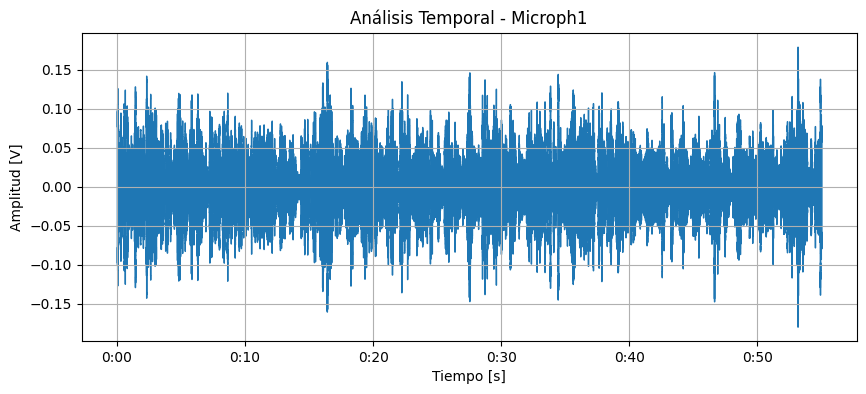

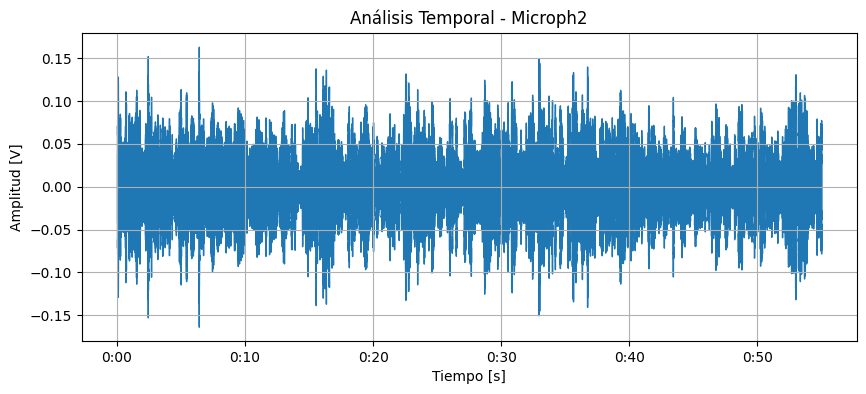

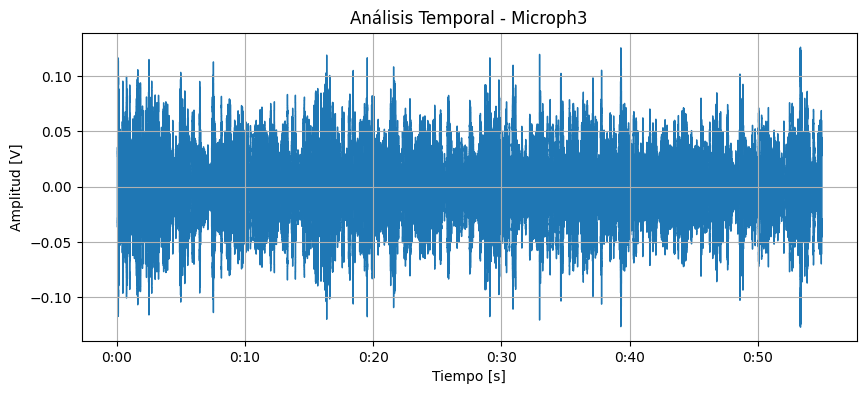

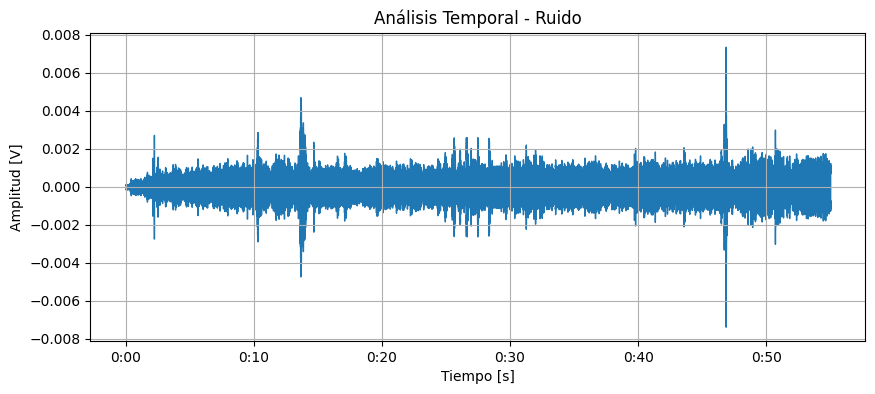

In [6]:
# Función para graficar el análisis temporal
def analisis_temporal(signal, sr, titulo):
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(signal, sr=sr)
    plt.title(titulo)
    plt.xlabel('Tiempo [s]')
    plt.ylabel('Amplitud [V]')
    plt.grid()
    plt.show()

# Graficar el análisis temporal de las señales
analisis_temporal(sig1, S1, 'Análisis Temporal - Microph1')
analisis_temporal(sig2, S2, 'Análisis Temporal - Microph2')
analisis_temporal(sig3, S3, 'Análisis Temporal - Microph3')
analisis_temporal(sig0, R0, 'Análisis Temporal - Ruido')

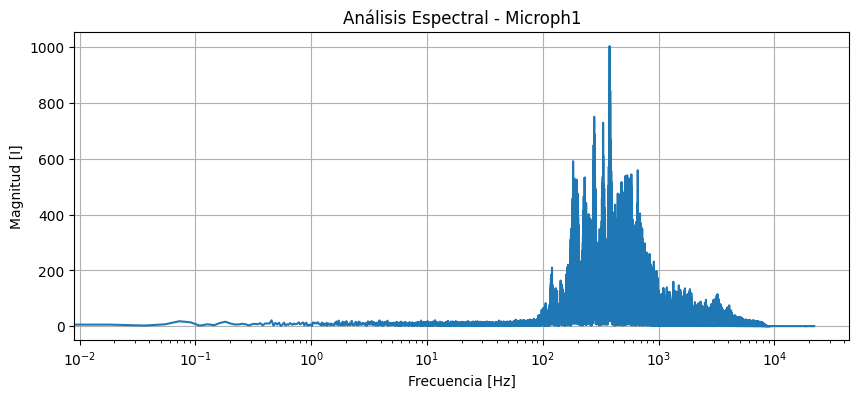

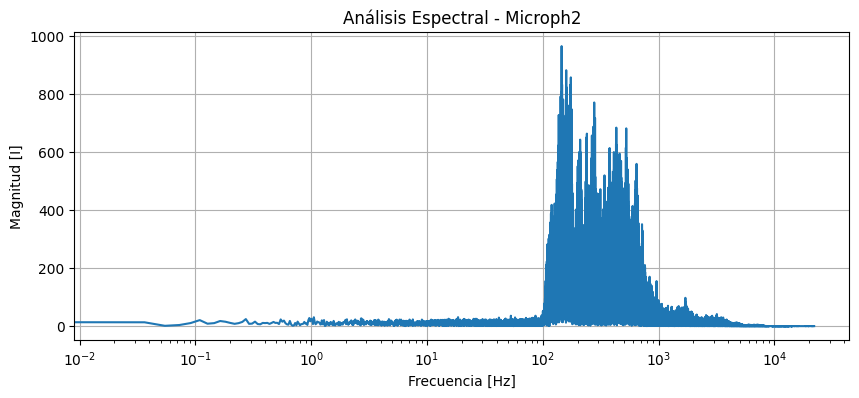

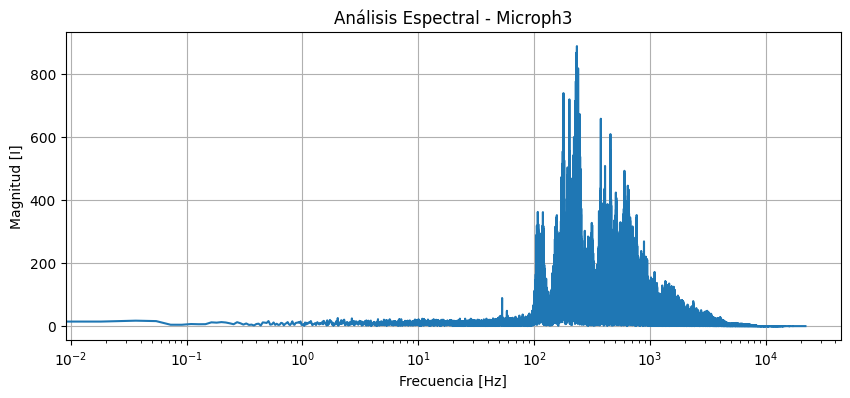

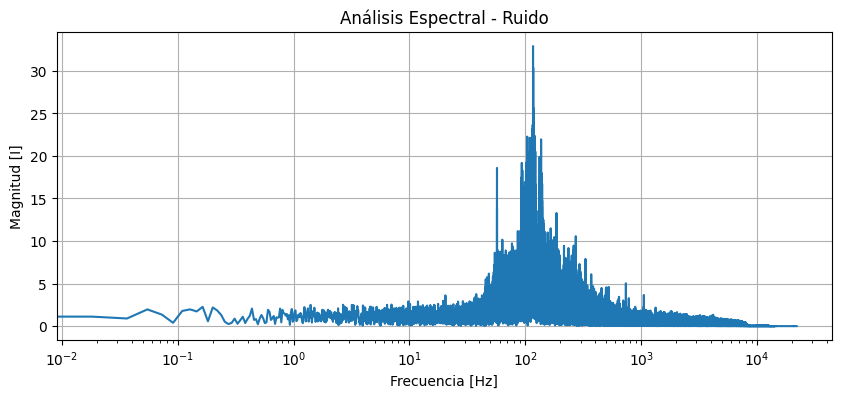

In [7]:
# Función para realizar y graficar el análisis espectral usando FFT
def analisis_espectral(signal, sr, titulo):
    # FFT
    fft_signal = np.fft.fft(signal)
    freqs = np.fft.fftfreq(len(fft_signal), 1/sr)

    # Magnitud de la FFT
    magnitud = np.abs(fft_signal)

    # Graficar solo la mitad positiva del espectro
    plt.figure(figsize=(10, 4))
    plt.semilogx(freqs[:len(freqs)//2], magnitud[:len(magnitud)//2])
    plt.title(titulo)
    plt.xlabel('Frecuencia [Hz]')
    plt.ylabel('Magnitud [I]') #Intensidad
    plt.grid()
    plt.show()

# Graficar el análisis espectral de las señales
analisis_espectral(sig1, S1, 'Análisis Espectral - Microph1')
analisis_espectral(sig2, S2, 'Análisis Espectral - Microph2')
analisis_espectral(sig3, S3, 'Análisis Espectral - Microph3')
analisis_espectral(sig0, R0, 'Análisis Espectral - Ruido')

Por último hacemos la separación de las fuentes

- **Separación de fuentes por ICA:**    El Análisis de Componentes Independientes (ICA) se usa para separar señales mezcladas en sus componentes independientes.
  
  >En este caso, el ICA aisla las voces de tres personas que están hablando simultáneamente. El parámetro ***n_components = 3*** le indica al algoritmo que trate de extraer tres señales independientes, lo que corresponde a las tres fuentes de sonido (tres personas) y el parámetro ***random_state = 0*** fija la aleatoriedad para que los resultados sean reproducibles.

  >El último parametro se puede variar de 0 a 1 o 2, dependiendo la voz que se quiera escuchar.

In [17]:
#Garantizar que las señales tengan la misma longitud
Lmin = min(len(sig1), len(sig2), len(sig3))
sig1 = sig1[:Lmin]
sig2 = sig2[:Lmin]
sig3 = sig3[:Lmin]

M = np.c_[sig1, sig2, sig3] #Matriz de señales de entrada

# Aplicar ICA para separar las señales
ICA = FastICA(n_components = 3, random_state =0)
S_ica = ICA.fit_transform(M)

# Seleccionar una sola voz (componente)
voz = S_ica[:, 0]

# Guardar la voz en archivo .wav
sf.write('Voz Separada.wav', voz, S1)

# Reproducir voz
print("Reproducción de voz separada: ")
print("")
display(Audio('Voz Separada.wav'))

Reproducción de voz separada: 



- **Separación de fuentes por Dominio de Frecuencia**

In [16]:
# Función para filtrar la frecuencia dominante
def F_frec(S, f_m, frec, A_b = 2000):  # Señal, frecuencia de muestreo, Frecuencia objetivo, Ancho de banda
    """ Filtra una frecuencia específica de la señal utilizando FFT. """
    N = len(S)
    T = 1.0 / f_m
    yf = fft(S)
    xf = fftfreq(N, T)

    # Filtro pasa banda ajustado
    F_pb = np.logical_and(xf > (frec - A_b / 2), xf < (frec + A_b / 2))

    # Aplicar el filtro
    F_yf = np.where(F_pb, yf, 0)

    # Transformada Inversa para obtener la señal filtrada
    S_F = np.real(ifft(F_yf))

    # Normalizar la señal filtrada
    S_F = S_F / np.max(np.abs(S_F))

    return S_F

# La voz que se va a extraer es la señal con el mejor SNR
if SNR1 >= SNR2 and SNR1 >= SNR3:
    Senal = sig1
    f_m = S1
elif SNR2 >= SNR1 and SNR2 >= SNR3:
    Senal = sig2
    f_m = S2
else:
    Senal = sig3
    f_m = S3

# Utilizar FFT para encontrar la frecuencia dominante en la señal objetivo
N = len(Senal)
T = 1.0 / f_m
yf = fft(Senal)
xf = fftfreq(N, T)
A_esp = np.abs(yf)

# Encontrar la frecuencia dominante (evitar frecuencias negativas)
D_f = xf[np.argmax(A_esp[:N // 2])]
print(f"Frecuencia dominante: {D_f:.2f} Hz")

# Filtrar la señal en torno a la frecuencia dominante
S_F = F_frec(Senal, f_m, D_f, A_b=1000)  # Ajustar el ancho de banda a 500 Hz para capturar solo la voz

# Verificar si la señal filtrada tiene energía
if np.max(np.abs(S_F)) == 0:
    print("La señal filtrada parece estar vacía. Revisa los parámetros del filtro o la frecuencia dominante.")
else:
    # Reproducir la señal filtrada
    print("Reproduciendo la señal filtrada...")
    display(Audio(data=S_F, rate=f_m))
    sd.wait()  # Esperar a que la reproducción termine

Frecuencia dominante: 144.75 Hz
Reproduciendo la señal filtrada...


**CONCLUSIÓN**

Si comparamos los 2 metodos ya planteados para la separación de fuentes, se puede considerar que el más preciso y que se ajusta a las necesidades es el ICA. Esto, ya que en la reproducción de la voz separada se tiene más claridad y se entiende más lo que dice la persona.

Mientras que con el método del dominio de frecuencia se nota solo un poco que una de las voces es más clara, sin embargo, esta se escucha como si la frecuencia del ruido fuese mayor a las frecuencias de las voces.